In [1]:
%load_ext autoreload
%autoreload 2

from scDCC import scDCC, SingleCellOnlyX
from torch.utils.data import DataLoader
import anndata
import torch
import umap
import matplotlib.pyplot as plt


In [3]:
ad_path = "pbmc_normalized.h5ad"
adata = anndata.read_h5ad(ad_path)

In [4]:
# load model
# model_path = "results/scDCC_azimuth/FTcheckpoint_21.pth.tar"
model_path = "results/scDCC_azimuth2/AE_weights_p0_1.pth.tar"
model = scDCC(input_dim=adata.n_vars, z_dim=32,
            encodeLayer=[256, 64], decodeLayer=[64, 256], n_clusters=31, save_dir='results/').cuda()
model.load_model(model_path)
model.sigma=0
model.eval()

scDCC(
  (encoder): Sequential(
    (0): Linear(in_features=6289, out_features=256, bias=True)
    (1): ReLU()
    (2): Linear(in_features=256, out_features=64, bias=True)
    (3): ReLU()
  )
  (decoder): Sequential(
    (0): Linear(in_features=32, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=256, bias=True)
    (3): ReLU()
  )
  (_enc_mu): Linear(in_features=64, out_features=32, bias=True)
  (_dec_mean): Sequential(
    (0): Linear(in_features=256, out_features=6289, bias=True)
    (1): MeanAct()
  )
  (_dec_disp): Sequential(
    (0): Linear(in_features=256, out_features=6289, bias=True)
    (1): DispAct()
  )
  (_dec_pi): Sequential(
    (0): Linear(in_features=256, out_features=6289, bias=True)
    (1): Sigmoid()
  )
  (zinb_loss): ZINBLoss()
)

In [5]:
dataset = SingleCellOnlyX(adata.X)
dataloader = DataLoader(dataset, batch_size=512, shuffle=False, drop_last=False)

In [6]:
embeddings = []
for batch in dataloader:
    emb, _, _, _, _ = model(batch.cuda())
    embeddings.append(emb.detach().cpu())
embeddings = torch.cat(embeddings)

In [7]:
reducer = umap.UMAP()
u_emb = reducer.fit_transform(embeddings)

/home/svcapp/.local/lib/python3.6/site-packages/numba/np/ufunc/parallel.py:365: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)


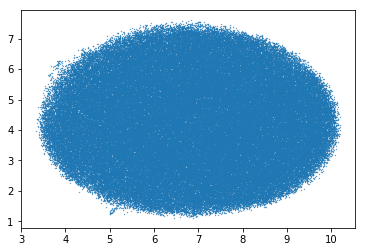

In [8]:
plt.figure()
plt.scatter(u_emb[:,0], u_emb[:,1], s=0.1)

In [ ]:
embeddings.shape

torch.Size([161764, 32])